В. В. БАТЫГИН, И. Н. ТОПТЫГИН
СБОРНИК ЗАДАЧ
по
ЭЛЕКТРОДИНАМИКЕ
МОСКВА 1970

512. Бесконечно протяженный диэлектрический слой заполняет в вакууме область $-a<=x<=a$ и имеет проницаемости $\epsilon$ и $\mu$.
Показать, что такой слой может действовать как волновод (для этого нужно, чтобы поле бегущей электромагнитной волны концентрировалось, в основном, внутри слоя). Определить типы волн, которые могут распространяться в таком волноводе. Ограничиться случаем, когда векторы поля не зависят от координаты $y$.

513. Диэлектрический слой с проницаемостями $\epsilon$, $\mu$, заполняющий область $0<=x<=a$, нанесен на поверхность идеального
проводника. В области $x>a$ - вакуум. Какие типы электромагнитных волн с амплитудой, убывающей при удалении от слоя, могут распространяться вдоль слоя? Сравнить возможные типы волн с системой волн, полученной в предыдущей задаче.

В издании 1962 года номера этих задач 464 и 465

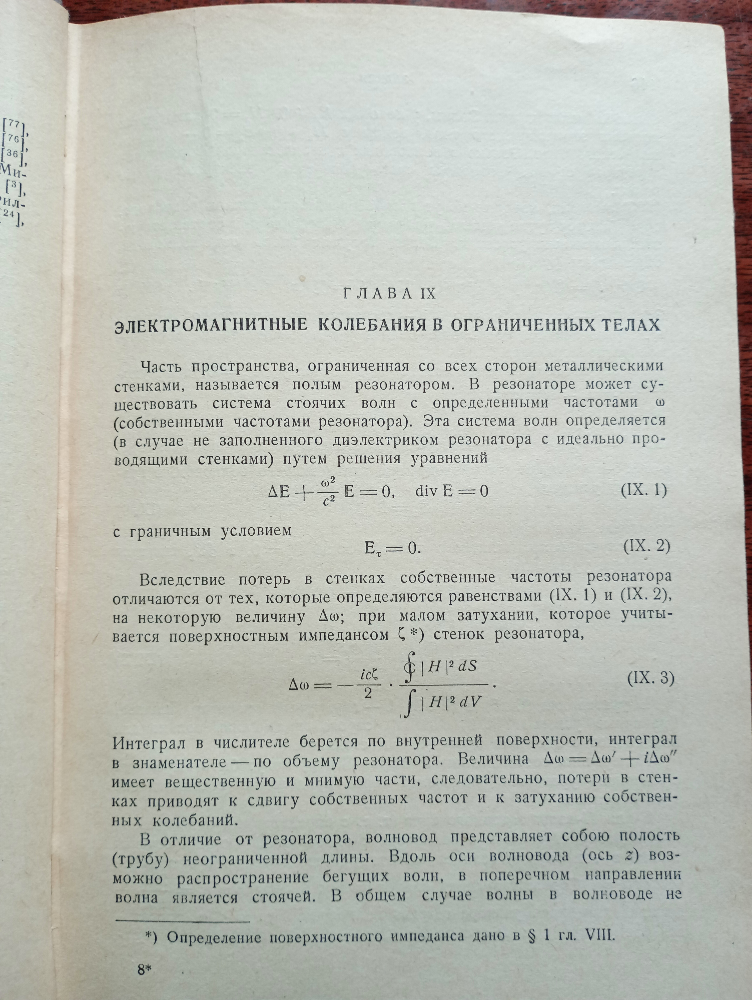

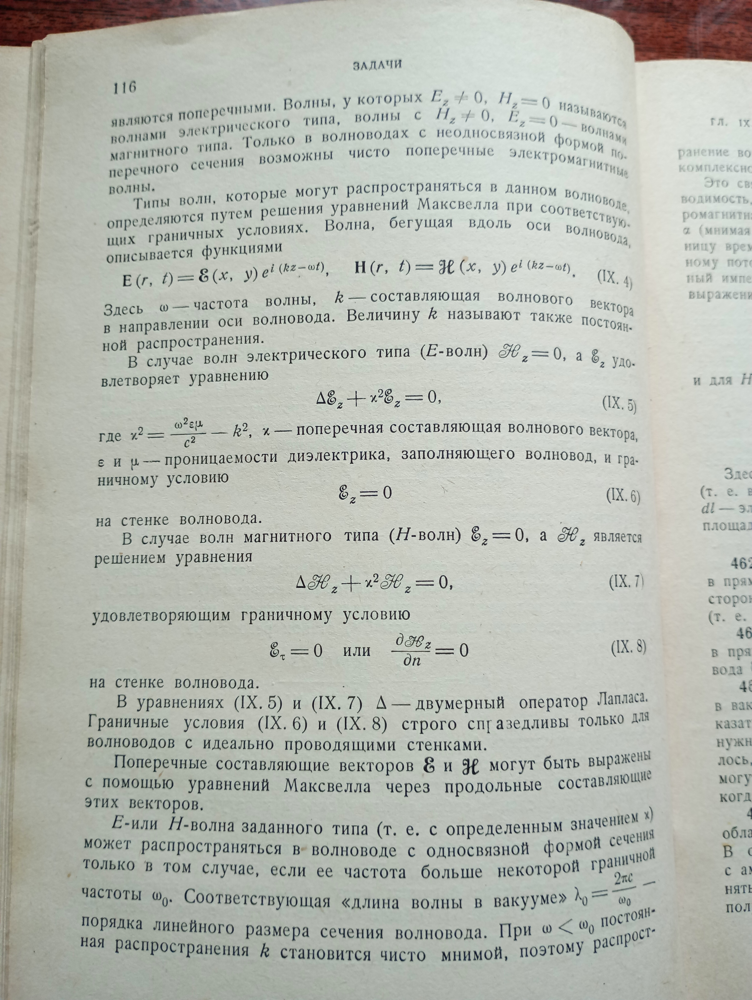

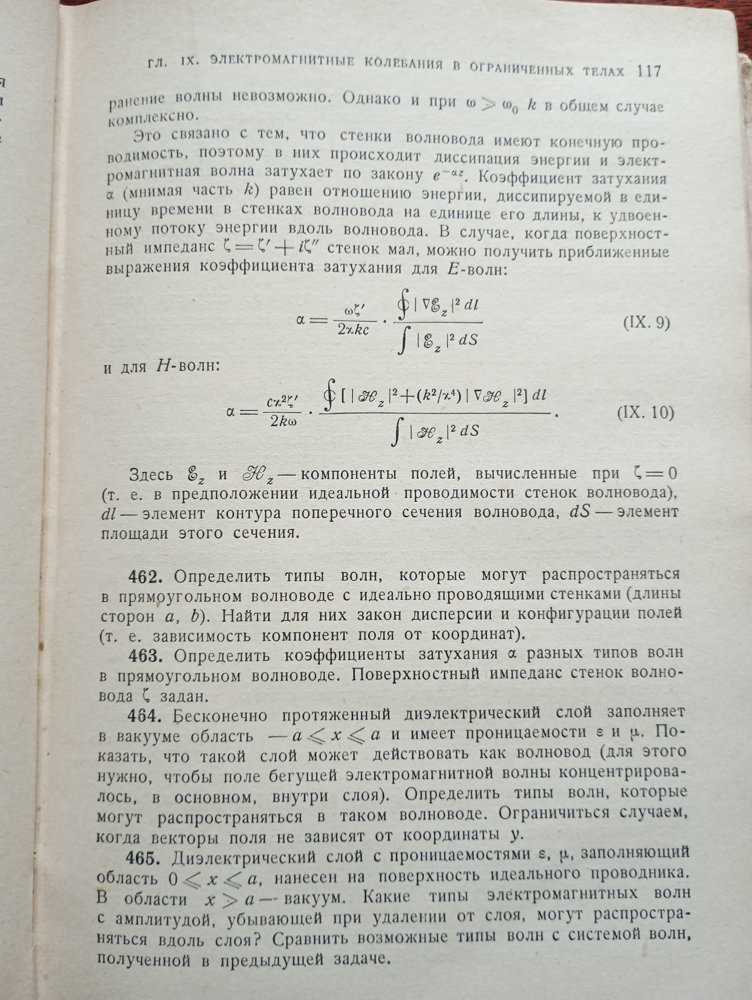

In [1]:
from IPython.display import display, Math, Latex

def disp(ex):
    display(Math(latex(ex)))

mu = var('mu')
assume(mu, 'real')
assume(mu>0)

epsilon = var('epsilon')
assume(epsilon, 'real')
assume(epsilon>0)

s = var ('s')
assume(s, 'real')
assume(s>0)

kappa = var ('kappa')
assume(kappa, 'real')
assume(kappa>0)

k = var ('k')
assume(k, 'real')

a = var('a')
assume(a, 'real')
assume(a>0)

x = var('x')
y = var('y')
z = var('z')

assume(x, 'real')
assume(y, 'real')
assume(z, 'real')

c = var('c')
assume(c, 'real')
assume(c>0)

omega = var('omega')
assume(omega, 'real')

$rot\,\vec{E} = \mu\,\frac{i\,\omega}{c}\,\vec{H}$

$rot\,\vec{H} = - \frac{i\,\omega}{c} \epsilon \vec{E}$

$rot\,rot\,\vec{E} = \mu\,\frac{i\,\omega}{c}rot\,\vec{H}$

$rot\,rot\,\vec{E} = \mu\,\frac{i\,\omega}{c}\left(- \frac{i\,\omega}{c} \epsilon \vec{E}\right)$

$rot\,rot\,\vec{E} = \mu\,\frac{\omega^2}{c^2} \epsilon \vec{E}$

$rot\,rot\,\vec{E} = grad\,div\,\vec{E} - Laplasian\,\vec{E}$

$Laplasian\,\vec{E} + \frac{\mu \epsilon \omega^2}{c^2}\,\vec{E} - grad\,div\,\vec{E} = 0$


$div\,\vec{E} = 0$

Ищем решение в виде

$\vec{E} = \vec{E}(x)\,e^{i\,k\,z}\,e^{-i\,\omega\,t}$

подставляя в исходное уравнение приходим к обыкновенному дифференциальному уравнению

$$\frac{\partial^{2}}{(\partial {x})^{2}}\vec{E}(x) + \left(\frac{\mu \epsilon \omega^2}{c^2} - k^2\right)\,\vec{E}(x) = 0$$

для диэлектрика производим следующую замену переменных

$\kappa^2 = \frac{\mu \epsilon \omega^2}{c^2} - k^2$

теперь

$$\frac{\partial^{2}}{(\partial {x})^{2}}\vec{E}(x) + \kappa^2\,\vec{E}(x) = 0$$

для вакуума с граничными условиями на бесконечности запишем

$-s^2 = \frac{\mu \epsilon \omega^2}{c^2} - k^2$

таким образом

$$\frac{\partial^{2}}{(\partial {x})^{2}}\vec{E}(x) - s^2\,\vec{E}(x) = 0$$

In [2]:
# исходя из вида дифференциальных уравнений для диэлектрика и вакуума
# записываем соотнощения для волнового вектора в виде уравнений
eq_kappa = mu * epsilon * omega^2 / c^2 - k^2 == kappa^2
# eq_s     = omega^2 / c^2 - k^2 == - s^2
eq_s     = omega^2 / c^2 + s^2 == k^2

print("eq_kappa =")
display(Math(latex(eq_kappa)))

print("eq_s =")
display(Math(latex(eq_s)))

eq_kappa_s = eq_kappa.subs(solve(eq_s, k^2)).full_simplify()
print("eq_kappa_s =")
display(Math(latex(eq_kappa_s)))

eq_s_kappa = eq_s.subs(solve(eq_kappa, k^2)).full_simplify()
print("eq_s_kappa =")
display(Math(latex(eq_s_kappa)))

# решаем полученные обыкновенные дифференциальные уравнения
E = function('E')(x)

de_dielectric = diff (E, x, 2) + kappa^2 * E == 0
E_dielectric = desolve(de_dielectric, E, ivar = x)
de_vacuum  = diff (E, x, 2) - s^2 * E == 0
E_vacuum = desolve(de_vacuum, E, ivar = x)

# получая таким образом выражения для электрического поля в диэлектрике и в вакууме
print("E_dielectric =")
display(Math(latex(E_dielectric)))
# _K2*cos(kappa*x) + _K1*sin(kappa*x)
print("E_vacuum =")
display(Math(latex(E_vacuum)))
# _K1*e^(s*x) + _K2*e^(-s*x)

eq_kappa =


<IPython.core.display.Math object>

eq_s =


<IPython.core.display.Math object>

eq_kappa_s =


<IPython.core.display.Math object>

eq_s_kappa =


<IPython.core.display.Math object>

E_dielectric =


<IPython.core.display.Math object>

E_vacuum =


<IPython.core.display.Math object>

In [3]:
B1_z = var ('B1_z')
B2_z = var ('B2_z')
A1_z = var ('A1_z')
A2_z = var ('A2_z')

B1_x = var ('B1_x')
B2_x = var ('B2_x')
A1_x = var ('A1_x')
A2_x = var ('A2_x')

assume("B1_z")

In [4]:
# выражения для электрического поля в диэлектрике и в вакууме
E_dielectric_z (x) = B1_z*cos(kappa*x) + B2_z*sin(kappa*x)
E_dielectric_x (x) = B1_x*cos(kappa*x) + B2_x*sin(kappa*x)

# x > a
E_vacuum2_z (x) = A2_z*e^(-s*x)
E_vacuum2_x (x) = A2_x*e^(-s*x)

# x < -a
E_vacuum1_z (x) = A1_z*e^(s*x)
E_vacuum1_x (x) = A1_x*e^(s*x)

In [5]:
# выражения для магнитного поля в диэлектрике и в вакууме
# H_y = c / (I * omega * mu) * (diff(E_x, z) - diff(E_z, x))

H_dielectric_y (x) = c / (I * omega * mu) * (I*k*E_dielectric_x (x) - diff(E_dielectric_z (x), x))
H_vacuum1_y (x) = c / (I * omega) * (I*k*E_vacuum1_x (x) - diff(E_vacuum1_z (x), x))
H_vacuum2_y (x) = c / (I * omega) * (I*k*E_vacuum2_x (x) - diff(E_vacuum2_z (x), x))

H_dielectric_y (x) = c / ( omega * mu) * (k*E_dielectric_x (x) + I * diff(E_dielectric_z (x), x))
H_vacuum1_y (x) = c / ( omega) * (k*E_vacuum1_x (x) + I * diff(E_vacuum1_z (x), x))
H_vacuum2_y (x) = c / ( omega) * (k*E_vacuum2_x (x) + I * diff(E_vacuum2_z (x), x))

print ("H_dielectric_y (x) ")
display(Math(latex(H_dielectric_y (x).simplify())))
print ("H_vacuum1_y (x) =")
display(Math(latex(H_vacuum1_y (x))))
print ("H_vacuum2_y (x) =")
display(Math(latex(H_vacuum2_y (x))))

H_dielectric_y (x) 


<IPython.core.display.Math object>

H_vacuum1_y (x) =


<IPython.core.display.Math object>

H_vacuum2_y (x) =


<IPython.core.display.Math object>

In [6]:
# уравнение Максвелла для тока смещения
# rot_H = -I * epsilon * omega / c * E
# rot_H_x = - diff(H_y, z)
# rot_H_z = diff(H_y, x)

rot_H_dielectric_x = - I * k * H_dielectric_y (x)
rot_H_vacuum1_x    = - I * k * H_vacuum1_y (x)
rot_H_vacuum2_x    = - I * k * H_vacuum2_y (x)
rot_H_dielectric_z = diff(H_dielectric_y (x), x)
rot_H_vacuum1_z    = diff(H_vacuum1_y (x), x)
rot_H_vacuum2_z    = diff(H_vacuum2_y (x), x)

print ("rot_H_dielectric_x =")
display(Math(latex(rot_H_dielectric_x)))
print ("rot_H_vacuum1_x =")
display(Math(latex(rot_H_vacuum1_x)))
print ("rot_H_vacuum2_x =")
display(Math(latex(rot_H_vacuum2_x)))
print ("rot_H_dielectric_z =")
display(Math(latex(rot_H_dielectric_z)))
print ("rot_H_vacuum1_z =")
display(Math(latex(rot_H_vacuum1_z)))
print ("rot_H_vacuum2_z =")
display(Math(latex(rot_H_vacuum2_z)))

rot_H_dielectric_x =


<IPython.core.display.Math object>

rot_H_vacuum1_x =


<IPython.core.display.Math object>

rot_H_vacuum2_x =


<IPython.core.display.Math object>

rot_H_dielectric_z =


<IPython.core.display.Math object>

rot_H_vacuum1_z =


<IPython.core.display.Math object>

rot_H_vacuum2_z =


<IPython.core.display.Math object>

In [7]:
eq_rot_H_dielectric_x = rot_H_dielectric_x == -I * omega / c * epsilon * E_dielectric_x (x)
eq_rot_H_dielectric_z = rot_H_dielectric_z == -I * omega / c * epsilon * E_dielectric_z (x)
eq_rot_H_vacuum1_x    = rot_H_vacuum1_x    == -I * omega / c * E_vacuum1_x (x)
eq_rot_H_vacuum2_x    = rot_H_vacuum2_x    == -I * omega / c * E_vacuum2_x (x)
eq_rot_H_vacuum1_z    = rot_H_vacuum1_z    == -I * omega / c * E_vacuum1_z (x)
eq_rot_H_vacuum2_z    = rot_H_vacuum2_z    == -I * omega / c * E_vacuum2_z (x)

In [8]:
print ("eq_rot_H_dielectric_x =")
display(Math(latex(eq_rot_H_dielectric_x.simplify())))
print ("eq_rot_H_dielectric_z =")
display(Math(latex(eq_rot_H_dielectric_z.simplify())))

eq_rot_H_dielectric_x =


<IPython.core.display.Math object>

eq_rot_H_dielectric_z =


<IPython.core.display.Math object>

In [9]:
print ("eq_rot_H_vacuum2_x =")
display(Math(latex(eq_rot_H_vacuum2_x.simplify())))
print ("eq_rot_H_vacuum2_z =")
display(Math(latex(eq_rot_H_vacuum2_z.simplify())))

eq_rot_H_vacuum2_x =


<IPython.core.display.Math object>

eq_rot_H_vacuum2_z =


<IPython.core.display.Math object>

In [10]:
res = solve( eq_rot_H_dielectric_x.subs(B1_z==0, B2_x==0), B1_x)
display(Math(latex(res)))

<IPython.core.display.Math object>

In [11]:
res = solve( eq_kappa, kappa)
display(Math(latex(res)))

<IPython.core.display.Math object>

In [12]:
res = solve( eq_rot_H_dielectric_z.subs(B1_z==0, B2_x==0), B1_x)
display(Math(latex(res)))

<IPython.core.display.Math object>

In [13]:
# граничные условия на гринице вакуума и диэлектрика
# тангенциальная компонента электрического поля
eqEz_a  = E_dielectric_z (a)  == E_vacuum2_z (a)
eqEz_ma = E_dielectric_z (-a) == E_vacuum1_z (-a)

print ("eqEz_a = ")
display(Math(latex(eqEz_a)))
print ("eqEz_ma = ")
display(Math(latex(eqEz_ma)))


eqEz_a = 


<IPython.core.display.Math object>

eqEz_ma = 


<IPython.core.display.Math object>

In [14]:
# нормальная компонента электрического смещения
eqEx_a  = E_dielectric_x (a) * epsilon  == E_vacuum2_x (a)
eqEx_ma = E_dielectric_x (-a) * epsilon == E_vacuum1_x (-a)

print ("eqEx_a =")
display(Math(latex(eqEx_a)))
print ("eqEx_ma =")
display(Math(latex(eqEx_ma)))


eqEx_a =


<IPython.core.display.Math object>

eqEx_ma =


<IPython.core.display.Math object>

In [15]:
# тангенциальная компонента напряженности магнитного поля
eqHy_a  = H_vacuum2_y (a)  == H_dielectric_y (a)
eqHy_ma = H_vacuum1_y (-a) == H_dielectric_y (-a)

print ("eqHy_a =")
display(Math(latex(eqHy_a)))
print ("eqHy_ma =")
display(Math(latex(eqHy_ma)))

eqHy_a =


<IPython.core.display.Math object>

eqHy_ma =


<IPython.core.display.Math object>

In [16]:
def GenerateMatrix(equsys, vars):
    A=matrix(SR, [[(equ.lhs() - equ.rhs()).coefficient(v) for v in vars] for equ in equsys])
    return A

def GenerateMatrixSubs(equsys, vars, vars_subs):
    A=matrix(SR, [[(equ.lhs() - equ.rhs()).subs(vars_subs).coefficient(v) for v in vars] for equ in equsys])
    return A

def GenerateMatrixMult(equsys, vars):
    A=matrix(SR, [[(equ.lhs() - equ.rhs()).coefficient(v) * v for v in vars] for equ in equsys])
    return A

def reduceDependedRows(M):
    print ("")
    print ("M.nrows()", M.nrows())
    print ("M.ncols()", M.ncols())
    print ("M.rank()", M.rank())

    M_pivot_rows = M.pivot_rows()
    print ("M.pivot_rows() =", M_pivot_rows)

    M_rows = M.rows()
    for row in M_rows:
        print ("row =", row)

    reduced_list = []
    for r in M_pivot_rows:
        print ("M_rows[", r, "] =")
        display(Math(latex(M_rows[r])))
        reduced_list.append(M_rows[r])

    reduced_M = matrix(SR, len(M_pivot_rows), M.ncols(), reduced_list)
    reduced_M_det = reduced_M.det()
    print ("")
    print("reduced_M.det() =", reduced_M_det)
    return reduced_M

In [17]:
def rot_H_solve(M_rotH, vars, eq_s_or_kappa, s_or_kappa):
    x = vector(SR, vars)
    y = vector(SR, [0, 0])
    eqns = [(M_rotH*x)[index] == y[index] for index in [0,1]]
    display(Math(latex(eqns)))
    res = []

    for index in [0,1]:
        eq = eqns[index]
        print("solve([eq, var])")
        display(Math(latex([eq, vars[0]])))
        print("")

        sol = solve(eq, vars[0])
        print("sol=")
        display(Math(latex(sol[0])))
        # print(solve(eq, vars[1]))
        print("eq_s_or_kappa =")
        display(Math(latex(eq_s_or_kappa)))
        sol_s_or_kappa_2 = solve(eq_s_or_kappa, s_or_kappa^2)
        print("sol_s_or_kappa_2[0].rhs()=")
        display(Math(latex(sol_s_or_kappa_2[0].rhs())))
        print("")
        s = sol[0].rhs().collect(vars[1])
        ans1 = s.subs(sol_s_or_kappa_2[0].rhs()*c^2==sol_s_or_kappa_2[0].lhs()*c^2)
        ans2 = s.subs(-sol_s_or_kappa_2[0].rhs()*c^2==-sol_s_or_kappa_2[0].lhs()*c^2)

        ans = ans1
        if ans1.number_of_operands() > ans2.number_of_operands():
            ans = ans2
        print("ans =")
        display(Math(latex(ans)))
        if omega in ans.arguments():
            print(ans.arguments())
            sol_omega_2 = solve(eq_s_or_kappa, omega^2)
            print("sol_omega_2 =")
            display(Math(latex(sol_omega_2[0].rhs())))
            som = ans.subs(omega^2 == sol_omega_2[0].rhs())
            print("som =")
            display(Math(latex(som)))
            som = som.full_simplify()
            print("som =")
            display(Math(latex(som)))
            res.append(vars[0] == som)
        else:
            res.append(vars[0] == ans)

        print("")
    return res

In [18]:
eqsys_rotH_dielectric = [eq_rot_H_dielectric_x*(-I)*omega/c,
                         eq_rot_H_dielectric_z*(-I)*omega/c,
                        ]

eqsys_rotH_vacuum = [ # eq_rot_H_vacuum1_x*(-I)*omega/c,
                      eq_rot_H_vacuum2_x*(-I)*omega/c,
                      # eq_rot_H_vacuum1_z*(-I)*omega/c,
                      eq_rot_H_vacuum2_z*(-I)*omega/c,
                    ]

eqsys_boundary_conditions = [eqEx_a,  eqEz_a,  # eqHy_a*(-I)*omega/c,
                             eqEx_ma, eqEz_ma, # eqHy_ma*(-I)*omega/c,
                            ]

In [19]:
eqsys_rotH_dielectric

[-(I*B2_z*kappa*cos(kappa*x) - I*B1_z*kappa*sin(kappa*x) + (B1_x*cos(kappa*x) + B2_x*sin(kappa*x))*k)*k/mu == -(B1_x*cos(kappa*x) + B2_x*sin(kappa*x))*epsilon*omega^2/c^2,
 -I*(-I*B1_z*kappa^2*cos(kappa*x) - I*B2_z*kappa^2*sin(kappa*x) + (B2_x*kappa*cos(kappa*x) - B1_x*kappa*sin(kappa*x))*k)/mu == -(B1_z*cos(kappa*x) + B2_z*sin(kappa*x))*epsilon*omega^2/c^2]

In [20]:
eqsys_rotH_vacuum

[-(A2_x*k*e^(-s*x) - I*A2_z*s*e^(-s*x))*k == -A2_x*omega^2*e^(-s*x)/c^2,
 I*A2_x*k*s*e^(-s*x) + A2_z*s^2*e^(-s*x) == -A2_z*omega^2*e^(-s*x)/c^2]

In [21]:
eqsys_boundary_conditions

[(B1_x*cos(a*kappa) + B2_x*sin(a*kappa))*epsilon == A2_x*e^(-a*s),
 B1_z*cos(a*kappa) + B2_z*sin(a*kappa) == A2_z*e^(-a*s),
 (B1_x*cos(a*kappa) - B2_x*sin(a*kappa))*epsilon == A1_x*e^(-a*s),
 B1_z*cos(a*kappa) - B2_z*sin(a*kappa) == A1_z*e^(-a*s)]

In [22]:
# чётные
even_vars = [B1_x, B2_z, A2_x, A2_z]
eqsys_even = [A1_z == - A2_z, A1_x == A2_x]

even_vars_dielectric = [B1_x, B2_z]

# выражения для электрического поля в диэлектрике
#   E_dielectric_z (x) = B1_z*cos(kappa*x) + B2_z*sin(kappa*x)
#   E_dielectric_x (x) = B1_x*cos(kappa*x) + B2_x*sin(kappa*x)

# граничные условия на границе идеального проводника и вакуума внутри резонатора
# тангенциальная компонента электрического поля
# B1_z == 0

# условие отражающие выбор именно чётного характера решения
# B2_x == 0

even_eqs_dielectric = [B2_x == 0, B1_z == 0]

even_M_rotH_dielectric = GenerateMatrix(eqsys_rotH_dielectric, even_vars_dielectric)
print ("even_M_rotH_dielectric =")
display(Math(latex(even_M_rotH_dielectric)))

even_M_rotH_dielectric =


<IPython.core.display.Math object>

In [23]:
even_res_rotH_dielectric = rot_H_solve(even_M_rotH_dielectric, even_vars_dielectric, eq_kappa, kappa)

<IPython.core.display.Math object>

solve([eq, var])


<IPython.core.display.Math object>


sol=


<IPython.core.display.Math object>

eq_s_or_kappa =


<IPython.core.display.Math object>

sol_s_or_kappa_2[0].rhs()=


<IPython.core.display.Math object>


ans =


<IPython.core.display.Math object>


solve([eq, var])


<IPython.core.display.Math object>


sol=


<IPython.core.display.Math object>

eq_s_or_kappa =


<IPython.core.display.Math object>

sol_s_or_kappa_2[0].rhs()=


<IPython.core.display.Math object>


ans =


<IPython.core.display.Math object>

(B2_z, c, epsilon, k, kappa, mu, omega)
sol_omega_2 =


<IPython.core.display.Math object>

som =


<IPython.core.display.Math object>

som =


<IPython.core.display.Math object>

In [24]:
print ("even_res_rotH_dielectric =")
display(Math(latex(even_res_rotH_dielectric)))

even_res_rotH_dielectric =


<IPython.core.display.Math object>

In [25]:
even_vars_vacuum = [A2_x, A2_z]

even_M_rotH_vacuum = GenerateMatrixSubs(eqsys_rotH_vacuum, even_vars_vacuum,  eqsys_even)
print ("even_M_rotH_vacuum =")
display(Math(latex(even_M_rotH_vacuum)))

even_M_rotH_vacuum =


<IPython.core.display.Math object>

In [26]:
even_res_rotH_vacuum = rot_H_solve(even_M_rotH_vacuum, even_vars_vacuum, eq_s, s)

<IPython.core.display.Math object>

solve([eq, var])


<IPython.core.display.Math object>


sol=


<IPython.core.display.Math object>

eq_s_or_kappa =


<IPython.core.display.Math object>

sol_s_or_kappa_2[0].rhs()=


<IPython.core.display.Math object>


ans =


<IPython.core.display.Math object>


solve([eq, var])


<IPython.core.display.Math object>


sol=


<IPython.core.display.Math object>

eq_s_or_kappa =


<IPython.core.display.Math object>

sol_s_or_kappa_2[0].rhs()=


<IPython.core.display.Math object>


ans =


<IPython.core.display.Math object>

(A2_z, c, k, omega, s)
sol_omega_2 =


<IPython.core.display.Math object>

som =


<IPython.core.display.Math object>

som =


<IPython.core.display.Math object>

In [27]:
print ("even_res_rotH_vacuum =")
display(Math(latex(even_res_rotH_vacuum)))
# even_res_rotH_vacuum = [_A2_x == I*_A2_z*k/s, _A2_x == I*_A2_z*k/s]

even_res_rotH_vacuum =


<IPython.core.display.Math object>

In [28]:
eqsys_boundary_conditions

[(B1_x*cos(a*kappa) + B2_x*sin(a*kappa))*epsilon == A2_x*e^(-a*s),
 B1_z*cos(a*kappa) + B2_z*sin(a*kappa) == A2_z*e^(-a*s),
 (B1_x*cos(a*kappa) - B2_x*sin(a*kappa))*epsilon == A1_x*e^(-a*s),
 B1_z*cos(a*kappa) - B2_z*sin(a*kappa) == A1_z*e^(-a*s)]

In [29]:
even_M = GenerateMatrixSubs(eqsys_boundary_conditions + even_res_rotH_dielectric + even_res_rotH_vacuum, even_vars, eqsys_even)
print ("even_M =")
display(Math(latex(even_M)))

even_M =


<IPython.core.display.Math object>

In [30]:
even_reduced_M = reduceDependedRows(even_M)
even_reduced_M_det = even_reduced_M.det()


M.nrows() 8
M.ncols() 4
M.rank() 4
M.pivot_rows() = (0, 1, 4, 6)
row = (epsilon*cos(a*kappa), 0, -e^(-a*s), 0)
row = (0, sin(a*kappa), 0, -e^(-a*s))
row = (epsilon*cos(a*kappa), 0, -e^(-a*s), 0)
row = (0, -sin(a*kappa), 0, e^(-a*s))
row = (1, -I*k/kappa, 0, 0)
row = (1, -I*k/kappa, 0, 0)
row = (0, 0, 1, -I*k/s)
row = (0, 0, 1, -I*k/s)
M_rows[ 0 ] =


<IPython.core.display.Math object>

M_rows[ 1 ] =


<IPython.core.display.Math object>

M_rows[ 4 ] =


<IPython.core.display.Math object>

M_rows[ 6 ] =


<IPython.core.display.Math object>


reduced_M.det() = I*epsilon*k*cos(a*kappa)*e^(-a*s)/kappa - I*k*e^(-a*s)*sin(a*kappa)/s


In [31]:
print ("even_reduced_M_det =")
display(Math(latex(even_reduced_M_det)))

even_reduced_M_det =


<IPython.core.display.Math object>

In [32]:
even_disp_eq = solve([even_reduced_M_det == 0], s)
print ("even_disp_eq =")
display(Math(latex(even_disp_eq)))

even_disp_eq =


<IPython.core.display.Math object>

In [33]:
even_H_dielectric_y (x) = H_dielectric_y (x).subs(even_res_rotH_dielectric[0]).subs(even_eqs_dielectric).subs(solve(eq_kappa,k^2)).full_simplify()
even_H_vacuum1_y    (x) = H_vacuum1_y    (x).subs(eqsys_even).subs(even_res_rotH_vacuum[0]).subs(solve(eq_s,k^2)).full_simplify()
even_H_vacuum2_y    (x) = H_vacuum2_y    (x).subs(eqsys_even).subs(even_res_rotH_vacuum[0]).subs(solve(eq_s,k^2)).full_simplify()

print ("even_H_dielectric_y (x) ", even_H_dielectric_y (x))
print ("even_H_vacuum1_y (x) =", even_H_vacuum1_y (x))
print ("even_H_vacuum2_y (x) =", even_H_vacuum2_y (x))


even_H_dielectric_y (x)  I*B2_z*epsilon*omega*cos(kappa*x)/(c*kappa)
even_H_vacuum1_y (x) = I*A2_z*omega*e^(s*x)/(c*s)
even_H_vacuum2_y (x) = I*A2_z*omega*e^(-s*x)/(c*s)


In [34]:
even_E_dielectric_z (x) = E_dielectric_z (x).subs(even_res_rotH_dielectric[0]).subs(even_eqs_dielectric).subs(solve(eq_kappa,k^2)).full_simplify()
even_E_dielectric_x (x) = E_dielectric_x (x).subs(even_res_rotH_dielectric[0]).subs(even_eqs_dielectric).subs(solve(eq_kappa,k^2)).full_simplify()

# x > a
even_E_vacuum2_z (x) = E_vacuum2_z (x).subs(eqsys_even).subs(even_res_rotH_vacuum[0]).subs(solve(eq_s,k^2)).full_simplify()
even_E_vacuum2_x (x) = E_vacuum2_x (x).subs(eqsys_even).subs(even_res_rotH_vacuum[0]).subs(solve(eq_s,k^2)).full_simplify()

# x < -a
even_E_vacuum1_z (x) = E_vacuum1_z (x).subs(eqsys_even).subs(even_res_rotH_vacuum[0]).subs(solve(eq_s,k^2)).full_simplify()
even_E_vacuum1_x (x) = E_vacuum1_x (x).subs(eqsys_even).subs(even_res_rotH_vacuum[0]).subs(solve(eq_s,k^2)).full_simplify()


print ("even_E_dielectric_z (x) =", even_E_dielectric_z (x))
print ("even_E_dielectric_x (x) =", even_E_dielectric_x (x))
print ("")

print ("even_E_vacuum2_z (x) =", even_E_vacuum2_z (x))
print ("even_E_vacuum2_x (x) =", even_E_vacuum2_x (x))
print ("")

print ("even_E_vacuum1_z (x) =", even_E_vacuum1_z (x))
print ("even_E_vacuum1_x (x) =", even_E_vacuum1_x (x))
print ("")

even_E_dielectric_z (x) = B2_z*sin(kappa*x)
even_E_dielectric_x (x) = I*B2_z*k*cos(kappa*x)/kappa

even_E_vacuum2_z (x) = A2_z*e^(-s*x)
even_E_vacuum2_x (x) = I*A2_z*k*e^(-s*x)/s

even_E_vacuum1_z (x) = -A2_z*e^(s*x)
even_E_vacuum1_x (x) = I*A2_z*k*e^(s*x)/s



In [35]:
# тангенциальная компонента напряженности магнитного поля
even_eqHy_a  = even_H_vacuum2_y (a)  == even_H_dielectric_y (a)
even_eqHy_ma = even_H_vacuum1_y (-a) == even_H_dielectric_y (-a)

In [36]:
even_A = solve (even_eqHy_a, A2_z)
print ("even_A =")
display(Math(latex(even_A)))
even_A = ((even_A[0].rhs()/e^(a*s)).subs(even_disp_eq).full_simplify())*e^(a*s)
print ("even_A =")
display(Math(latex(even_A)))

even_A =


<IPython.core.display.Math object>

even_A =


<IPython.core.display.Math object>

In [37]:
even_eq_kappa = eq_kappa_s.subs(even_disp_eq).full_simplify()
print("even_eq_kappa =")
display(Math(latex(even_eq_kappa)))

even_eq_kappa =


<IPython.core.display.Math object>

In [38]:
even_sol_kappa = solve(even_eq_kappa, kappa)
print("even_sol_kappa =")
display(Math(latex(even_sol_kappa)))

even_sol_kappa =


<IPython.core.display.Math object>

In [39]:
# eq_kappa_s = eq_kappa.subs(solve(eq_s, k^2)).full_simplify()
eq_s2 = eq_kappa_s.solve(s^2)
eq_kappa2 = eq_kappa_s.solve(kappa^2)

print("eq_s2 =")
display(Math(latex(eq_s2[0].expand())))
print("eq_kappa2 =")
display(Math(latex(eq_kappa2[0].expand())))

eq_kappa2_s2 = (eq_kappa_s.solve(omega^2)[0]/c^2).full_simplify()

print("eq_kappa2_s2 =")
display(Math(latex(eq_kappa2_s2)))

eq_s2 =


<IPython.core.display.Math object>

eq_kappa2 =


<IPython.core.display.Math object>

eq_kappa2_s2 =


<IPython.core.display.Math object>

In [40]:
# sgs
A = 0.1
kappa_A_max = 13*pi.n()/2
s_A_max = 20
digit_values = [omega == 2*pi.n()*10^11, mu == 1, epsilon == 5, c == 299792458 * 100]
print (digit_values)

[omega == 6.28318530717959e11, mu == 1, epsilon == 5, c == 29979245800]


In [41]:
even_sol_kappa_d = even_sol_kappa[0].subs(digit_values)
print("even_sol_kappa_d =", even_sol_kappa_d)

even_sol_kappa_d = kappa^2 == 43925.6635603965*cos(a*kappa)^2/(25*cos(a*kappa)^2 + sin(a*kappa)^2)


In [42]:
even_disp_eq_d = even_disp_eq[0].subs(digit_values)
print ("even_disp_eq_d =", even_disp_eq_d)

even_disp_eq_d = s == 1/5*kappa*sin(a*kappa)/cos(a*kappa)


In [43]:
even_disp_eq_da = even_disp_eq_d * a
print ("even_disp_eq_da =", even_disp_eq_da)

even_disp_eq_da = a*s == 1/5*a*kappa*sin(a*kappa)/cos(a*kappa)


In [44]:
even_disp_eq_d.rhs().subs(a * kappa == x).subs(kappa == x)

1/5*x*sin(x)/cos(x)

In [45]:
r = omega / c * sqrt(epsilon * mu - 1)
print ("r =", r)

r = r.subs(digit_values)
print ("r =", r)

r = sqrt(epsilon*mu - 1)*omega/c
r = 41.9169004390336


verbose 0 (3885: plot.py, generate_plot_points) WARNING: When plotting, failed to evaluate function at 159 points.
verbose 0 (3885: plot.py, generate_plot_points) Last error message: 'Unable to compute f(20.420352248333657)'


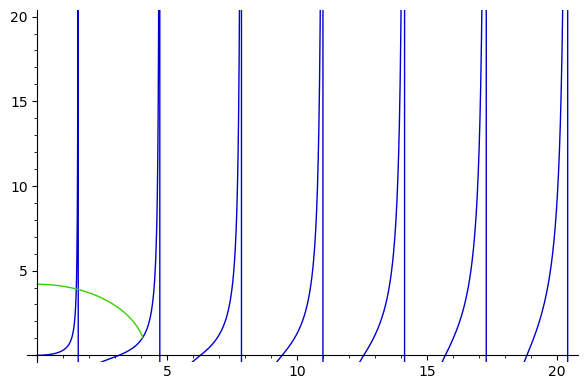

In [46]:
even_disp_eq_fa = lambda x : even_disp_eq_d.rhs().subs(kappa * a == x).subs(kappa == x)
p = plot([even_disp_eq_fa, sqrt((r * A)^2 - x^2)], (x, 0, kappa_A_max), ymin = 0, ymax = s_A_max)
p.show()

verbose 0 (3885: plot.py, generate_plot_points) WARNING: When plotting, failed to evaluate function at 158 points.
verbose 0 (3885: plot.py, generate_plot_points) Last error message: 'Unable to compute f(204.20352248333657)'


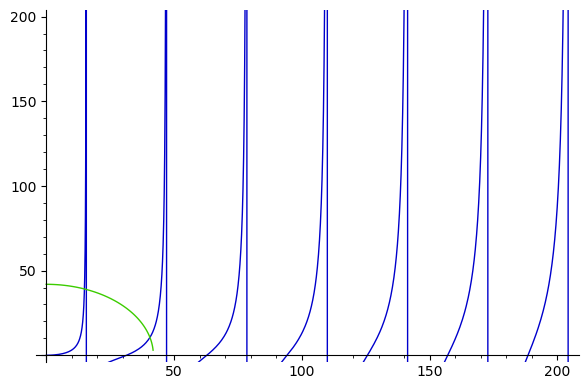

In [47]:
even_disp_eq_f = lambda x : even_disp_eq_d.rhs().subs(kappa == x).subs(a == A)
p = plot([even_disp_eq_f, sqrt((r)^2 - x^2)], (x, 0, kappa_A_max / A), ymin = 0, ymax = s_A_max / A)
p.show()

even_f(x) = 1/5*x*sin(0.100000000000000*x)/cos(0.100000000000000*x) - sqrt(-x^2 + 1757.02654241586)
verbose 0 (3885: plot.py, generate_plot_points) WARNING: When plotting, failed to evaluate function at 158 points.
verbose 0 (3885: plot.py, generate_plot_points) Last error message: 'unable to simplify to float approximation'


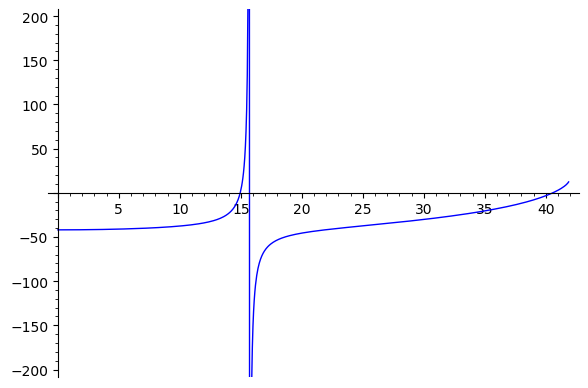

In [48]:
even_f = lambda x : even_disp_eq_f(x) - sqrt((r)^2 - x^2)
print ("even_f(x) =",even_f(x))
p = plot(even_f, (0, kappa_A_max / A), ymin = - s_A_max / A, ymax = s_A_max / A)
p.show()

In [49]:
even_kappa_sol = find_root(even_f(x) == 0, 0, pi/2/A)
print("even_kappa_sol", even_kappa_sol)

even_kappa_sol 14.946136934946512


In [50]:
even_s_sol = even_disp_eq_d.rhs()
print("even_s_sol =", even_s_sol)

even_s_sol = 1/5*kappa*sin(a*kappa)/cos(a*kappa)


In [51]:
even_s_sol = even_s_sol.subs(kappa == even_kappa_sol)
print("even_s_sol =", even_s_sol)

even_s_sol = 2.9892273869893025*sin(14.946136934946512*a)/cos(14.946136934946512*a)


In [52]:
even_s_sol = even_s_sol.subs(a == A)
print("even_s_sol =", even_s_sol)

even_s_sol = 39.1617100384761


In [53]:
even_k_sol = solve(eq_kappa, k)
print("even_k_sol =", even_k_sol)

even_k_sol = [
k == -sqrt(-c^2*kappa^2 + epsilon*mu*omega^2)/c,
k == sqrt(-c^2*kappa^2 + epsilon*mu*omega^2)/c
]


In [54]:
even_k_sol = abs(even_k_sol[0].rhs()).subs(digit_values).subs(kappa == even_kappa_sol)
print("even_k_sol =", even_k_sol)

even_k_sol = 44.4172958287833


In [55]:
even_E_dielectric_z_d (x) = even_E_dielectric_z (x).subs(B2_z == 1, kappa == even_kappa_sol)
print ("even_E_dielectric_z_d (x) =", even_E_dielectric_z_d (x))
even_E_vacuum2_z_d (x) = even_E_vacuum2_z (x).subs(A2_z == even_A).subs(B2_z == 1, s == even_s_sol, kappa == even_kappa_sol, a == A)
print ("even_E_vacuum2_z_d (x) =", even_E_vacuum2_z_d (x))

even_E_dielectric_z_d (x) = sin(14.946136934946512*x)
even_E_vacuum2_z_d (x) = 0.997099506421075*e^(-39.1617100384761*x + 3.91617100384761)


In [56]:
even_E_dielectric_x_d (x) = even_E_dielectric_x (x).subs(B2_z == 1, kappa == even_kappa_sol, k = even_k_sol)
print ("even_E_dielectric_x_d (x) =", even_E_dielectric_x_d (x))
even_E_vacuum2_x_d (x) = even_E_vacuum2_x (x).subs(A2_z == even_A).subs(B2_z == 1, s == even_s_sol, kappa == even_kappa_sol, k == even_k_sol, a == A)
print ("even_E_vacuum2_x_d (x) =", even_E_vacuum2_x_d (x))

even_E_dielectric_x_d (x) = 2.9718244936541693*I*cos(14.946136934946512*x)
even_E_vacuum2_x_d (x) = 1.13091240663203*I*e^(-39.1617100384761*x + 3.91617100384761)


In [57]:
even_H_dielectric_y_d (x) = even_H_dielectric_y (x).subs(B2_z == 1, kappa == even_kappa_sol).subs(digit_values)
print ("even_H_dielectric_y_d (x) =", even_H_dielectric_y_d (x))
even_H_vacuum2_y_d (x) = even_H_vacuum2_y (x).subs(A2_z == even_A).subs(B2_z == 1, s == even_s_sol, kappa == even_kappa_sol, a == A).subs(digit_values)
print ("even_H_vacuum2_y_d (x) =", even_H_vacuum2_y_d (x))

even_H_dielectric_y_d (x) = 7.01132684343087*I*cos(14.946136934946512*x)
even_H_vacuum2_y_d (x) = 0.533624817422403*I*e^(-39.1617100384761*x + 3.91617100384761)


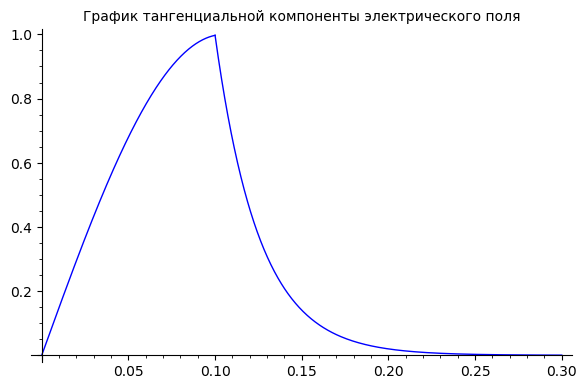

In [58]:
p = plot(even_E_dielectric_z_d (x), (x, 0, A))
p += plot(even_E_vacuum2_z_d (x), (x, A, 3*A))
p.show(title="График тангенциальной компоненты электрического поля")

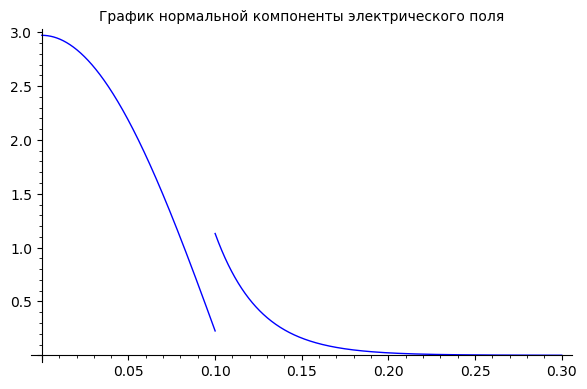

In [59]:
p = plot(even_E_dielectric_x_d (x).imag(), (x, 0, A))
p += plot(even_E_vacuum2_x_d (x).imag(), (x, A, 3*A))
p.show(title="График нормальной компоненты электрического поля")

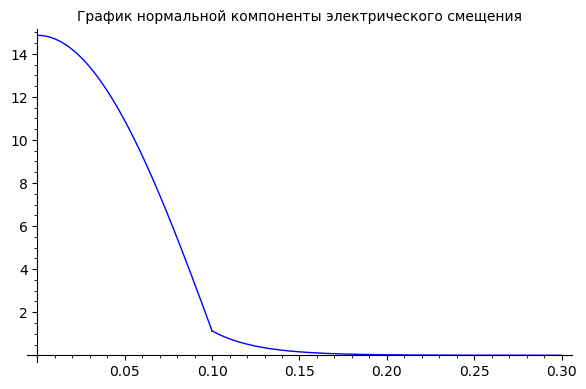

In [60]:
p = plot(even_E_dielectric_x_d (x).imag()*epsilon.subs(digit_values), (x, 0, A))
p += plot(even_E_vacuum2_x_d (x).imag(), (x, A, 3*A))
p.show(title="График нормальной компоненты электрического смещения")

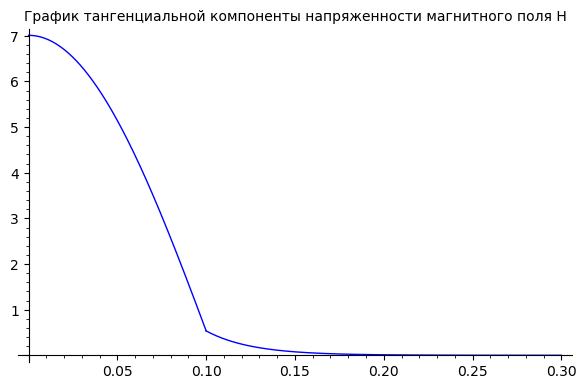

In [61]:
p = plot(even_H_dielectric_y_d (x).imag(), (x, 0, A))
p += plot(even_H_vacuum2_y_d (x).imag(), (x, A, 3*A))
p.show(title="График тангенциальной компоненты напряженности магнитного поля H")

Решение получено и соответствует приведенному в решебнике ответу.

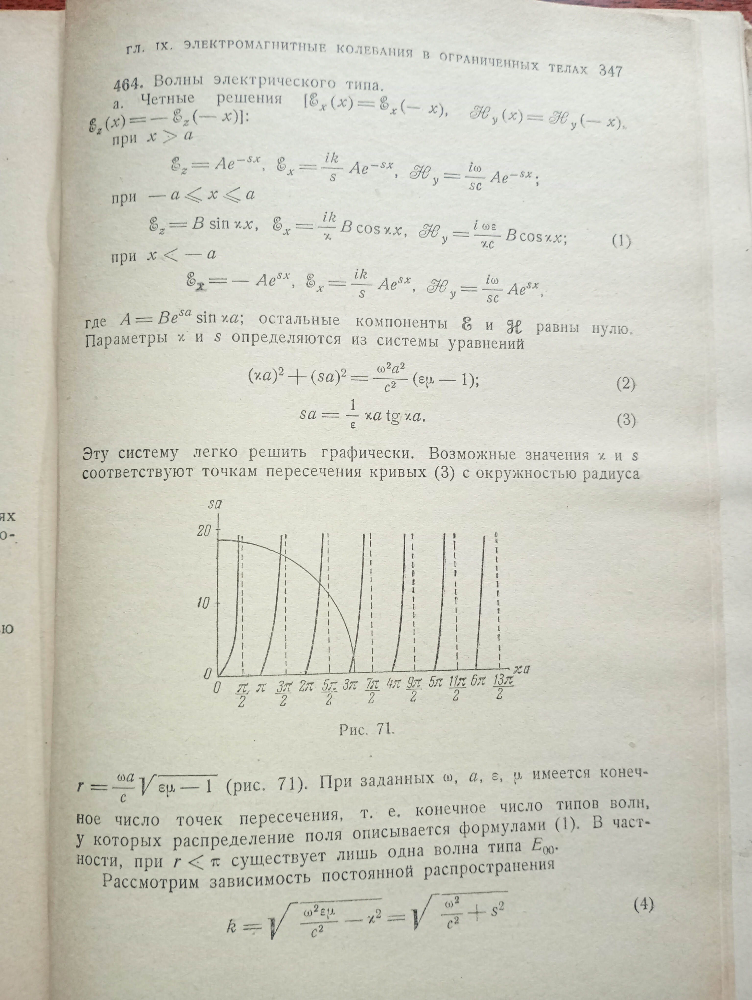

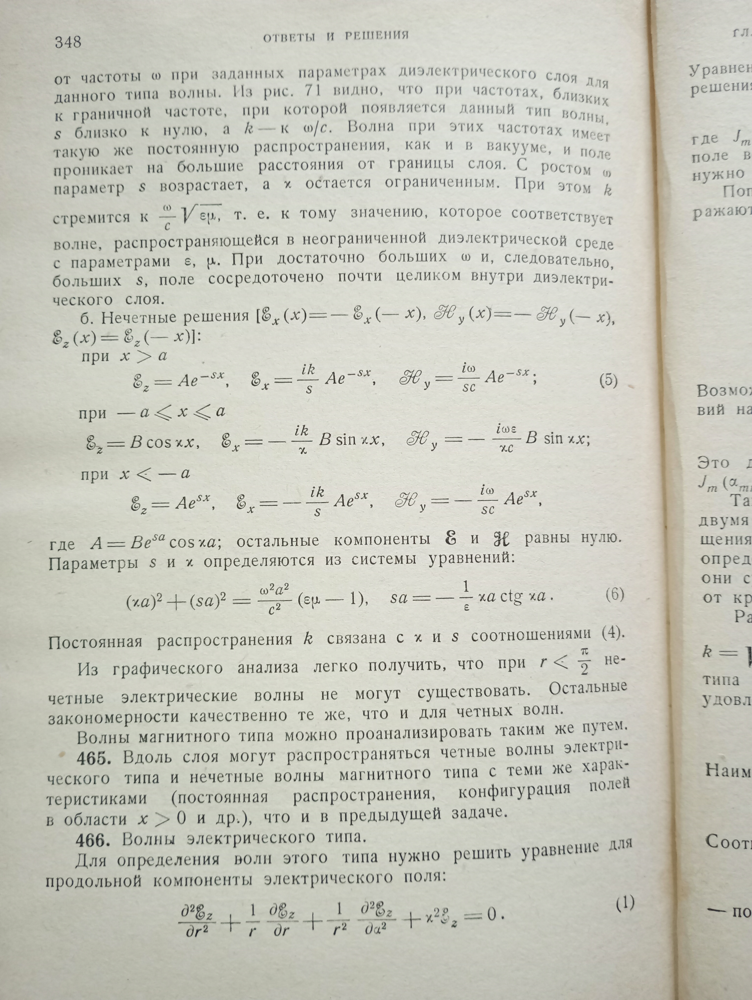

Теперь посчитаем:

1) силу Абрагама, приложенную к диэлектрику

2) пондеромоторную силу, приложенную к идеальному проводнику

3) пондеромоторную силу, приложенную к границе диэлектрика и вакуума

4) импульс поля в вакууме

In [62]:
# Abraham force
# (epsilon * mu - 1) / (4 * pi * c) * ([E x H]).diff(t)
# (epsilon * mu - 1) / (4 * pi * c) * ([E.diff(t) x H] + [E x H.diff(t)])
# ([a x b])_x = a_y * b_z - a_z * b_y
# f_x = (epsilon * mu - 1) / (4 * pi * c) * (-E_z.diff(t) * H_y - E_z * H_y.diff(t))
# E_z.diff(t) = -I * omega * E_z
# H_y.diff(t) = -I * omega * H_y

#
# alpha = - omega * t
#

# f_x = (epsilon * mu - 1) / (4 * pi * c) * 
#       integrate(
#         ( - Re(-I*omega * E_z * e^alpha) * Re(H_y * e^alpha)) +
#         ( - Re(E_z * e^alpha) * Re(-I*omega * H_y * e^alpha)) 
#       (alpha, 0, 2*pi))


# f_x = (epsilon * mu - 1) / (2 * 4 * pi * c) * (
#             ( - Re(-I*omega * E_z) * Re(H_y) - Im(-I*omega * E_z) * Im(H_y)) +
#             ( - Re(E_z) * Re(-I*omega * H_y) - Im(E_z) * Im(-I*omega * H_y)) 
#       )

f_x(x) = (epsilon * mu - 1) / (8 * pi * c) * \
    ( \
        - ( -I * omega * even_E_dielectric_z (x)).real_part() * (even_H_dielectric_y (x)).real_part() \
        - ( -I * omega * even_E_dielectric_z (x)).imag_part() * (even_H_dielectric_y (x)).imag_part() \
        - (even_E_dielectric_z (x)).real_part() * ( -I * omega * even_H_dielectric_y (x)).real_part() \
        - (even_E_dielectric_z (x)).imag_part() * ( -I * omega * even_H_dielectric_y (x)).imag_part() \
    )
print("f_x =", f_x(x))
display(Math(latex(f_x(x))))

f_x = 0


<IPython.core.display.Math object>

2) пондеромоторная сила, приложенная к идеальному проводнику

$-\int\limits_{T}^{}\frac{H_t^2}{8\pi} dt = -\frac{H_t^2}{16\pi}$

знак минус возникает из-за того что данная пондеромоторная сила направлена в отрицательном направлении относительно оси $x$

In [63]:
# superconductor force
# additional 1/2 arises as result of integration on period
f_superconductor = - abs((even_H_dielectric_y (0)^2) / (2*8*pi))
f_superconductor = ((even_H_dielectric_y (0)^2) / (2*8*pi))
print("f_superconductor =", f_superconductor)
display(Math(latex(f_superconductor)))

f_superconductor = -1/16*B2_z^2*epsilon^2*omega^2/(pi*c^2*kappa^2)


<IPython.core.display.Math object>

In [64]:
# using
display(Math(latex(eq_kappa2_s2)))

<IPython.core.display.Math object>

In [65]:
# we have
f_superconductor_ = f_superconductor.subs(eq_kappa2_s2.solve(omega)[0])
display(Math(latex(f_superconductor_)))

<IPython.core.display.Math object>

In [66]:
f_superconductor_d = f_superconductor.subs(digit_values).subs(B2_z == 1, kappa == even_kappa_sol)
print("f_superconductor =", f_superconductor_d)

f_superconductor = -3.07241900658839/pi


3) пондеромоторная сила, приложенная к границе диэлектрика и вакуума

компонента силы связанная с тангенциальной составляющей электрического поля

$\int\limits_{T}^{}\left(\frac{D_t\cdot E_t}{8\pi}|_{dielectric} - \frac{D_t \cdot E_t}{8\pi}|_{vacuum}\right)dt$

$\int\limits_{T}^{}\left(\frac{\epsilon\, E_t^2}{8\pi}|_{dielectric} - \frac{E_t^2}{8\pi}|_{vacuum}\right)dt$

$E_t|_{dielectric} = E_t|_{vacuum}$

$\left(\epsilon - 1\right)\int\limits_{T}^{}\frac{E_t^2}{8\pi}|_{dielectric}dt$

$\left(\epsilon - 1\right)\frac{E_t^2}{16\pi}|_{dielectric}$

In [67]:
# Static and dynamic electricity by William R. Smythe, second edition, 1950
# paragraph 18 formula 1.47
# tangential component of E
# additional 1/2 arises as result of integration on period
dDE_8pi_z = (epsilon-1) * (even_E_dielectric_z(a))^2 / (2*8*pi)
dDE_8pi_z
display(Math(latex(dDE_8pi_z)))

<IPython.core.display.Math object>

In [68]:
dDE_8pi_z_d = dDE_8pi_z.subs(digit_values).subs(B2_z == 1, kappa == even_kappa_sol, a == A)
dDE_8pi_z_d

0.248551856426288/pi

пондеромоторная сила, приложенная к границе диэлектрика и вакуума

компонента силы связанная с нормальной составляющей электрического поля

$\int\limits_{T}^{}\left(\frac{D_n\cdot E_n}{8\pi}|_{dielectric} - \frac{D_n \cdot E_n}{8\pi}|_{vacuum}\right)dt$

$\int\limits_{T}^{}\left(\frac{\epsilon\, E_n^2}{8\pi}|_{dielectric} - \frac{E_n^2}{8\pi}|_{vacuum}\right)dt$

$D_n|_{dielectric} = D_n|_{vacuum}$

$\epsilon\,E_n|_{dielectric} = E_n|_{vacuum}$

$\int\limits_{T}^{}\left(\frac{\epsilon\, E_n^2}{8\pi}|_{dielectric} - \frac{\epsilon^2\, E_n^2}{8\pi}|_{dielectric}\right)dt$

$\left(\epsilon - \epsilon^2\right)\int\limits_{T}^{}\frac{E_n^2}{8\pi}|_{dielectric}dt$

$\frac{\left(1 - \epsilon\right)\,\epsilon\,E_n^2}{16\pi}|_{dielectric}$

In [69]:
# Static and dynamic electricity by William R. Smythe, second edition, 1950
# paragraph 18 formula 1.45
# normal component of E
# additional 1/2 arises as result of integration on period
dDE_8pi_x = - (epsilon-1) * (epsilon/1) * (even_E_dielectric_x(a))^2 / (2*8*pi)
display(Math(latex(dDE_8pi_x)))

<IPython.core.display.Math object>

In [70]:
dDE_8pi_x_d = dDE_8pi_x.subs(digit_values).subs(B2_z == 1, kappa == even_kappa_sol, k == even_k_sol, a == A)
dDE_8pi_x_d

0.0639481435737125/pi

In [71]:
f_dielectric_surf = dDE_8pi_z + dDE_8pi_x
display(Math(latex(f_dielectric_surf)))

<IPython.core.display.Math object>

In [72]:
f_dielectric_surf_d = dDE_8pi_z_d + dDE_8pi_x_d
display(Math(latex(f_dielectric_surf_d)))

<IPython.core.display.Math object>

4) импульс поля в вакууме

In [73]:
# vacuum field momemtum
# 1 / (4 * pi * c) * ([E x H])
# p_x = 1 / (4 * pi * c) * (- E_z * H_y)

При расчёте импульса поля, по сути нужно нужно интегрировать вектор Пойтинга. Причем интегрировать как по времени, так и по координате x. Так вот при интегрировании по времени возникает следующий момент. Модуль электрического поля действителен а модуль магнитного поля мнимый. Это означает, что их фазы отличаются на $\pi/2$. При интегрировании по времени в пределах периода волны это приведет к нулевому импульсу поля

In [74]:
var("t")
assume(omega>0)

field_momemtum = \
((even_E_vacuum2_z (x) * exp(I*(k*z-omega*t))).real_part() * \
 (even_H_vacuum2_y (x) * exp(I*(k*z-omega*t))).real_part() ) \
 .integrate (t, 0, 2*pi/omega) / (2*pi/omega)

display(Math(latex(field_momemtum)))

<IPython.core.display.Math object>

Результаты вычислений показывают, что если зеркало используется в качестве волновода, или резонатора, то на его единицу площади должна действовать подъёмная сила, равная

In [75]:
display(Math(latex(f_superconductor + f_dielectric_surf + field_momemtum)))

<IPython.core.display.Math object>

In [76]:
display(Math(latex(f_superconductor_ + f_dielectric_surf + field_momemtum)))

<IPython.core.display.Math object>

In [77]:
f_superconductor_d + f_dielectric_surf_d

-2.75991900658839/pi

In [78]:
f_superconductor_d, dDE_8pi_z_d, dDE_8pi_x_d

(-3.07241900658839/pi, 0.248551856426288/pi, 0.0639481435737125/pi)

пондеромоторная сила, приложенная к границе диэлектрика и идеального проводника

компонента силы связанная с нормальной составляющей электрического поля

$\int\limits_{T}^{}\left(\frac{D_n\cdot E_n}{8\pi}|_{dielectric}\right)dt$

$\int\limits_{T}^{}\left(\frac{\epsilon\, E_n^2}{8\pi}|_{dielectric}\right)dt$

$\frac{\epsilon\,E_n^2}{16\pi}|_{dielectric}$

In [79]:
DE_8pi_x0 = - (epsilon)  * (even_E_dielectric_x(0))^2 / (2*8*pi)
display(Math(latex(DE_8pi_x0)))

<IPython.core.display.Math object>

In [80]:
DE_8pi_x0_d = DE_8pi_x0.subs(digit_values).subs(B2_z == 1, kappa == even_kappa_sol, k == even_k_sol, a == A)
DE_8pi_x0_d

2.75991900658839/pi

In [81]:
f_superconductor_d + f_dielectric_surf_d + DE_8pi_x0_d

0